In [1]:
%load_ext autoreload
%autoreload 2


from astropy.io import fits
import numpy as np
import astropy.coordinates
import astropy.units as u
from functions_pickle import *
from functions_data import data_download_from_date,hmi_daily_download, aia_correction
import matplotlib.pyplot as plt
import pfsspy
import sunpy
from tqdm import tqdm

from aiapy.calibrate import correct_degradation, update_pointing

from astropy.coordinates import SkyCoord
from sunpy.net import Fido,attrs
from sunpy.coordinates.sun import carrington_rotation_number, carrington_rotation_time


import warnings
warnings.filterwarnings('ignore')


In [2]:
m_hmi = restore('20160520/m_hmi_full_res.pickle')
m_aia = restore('20160520/m_aia.pickle')
pfss_input = restore('20160520/pfss_input.pickle')


In [3]:
change_obstime = lambda x,y: SkyCoord(x.replicate(observer=x.observer.replicate(obstime=y), obstime=y))
change_obstime_frame = lambda x,y: x.replicate_without_data(observer=x.observer.replicate(obstime=y), obstime=y)

In [4]:
car_rot_date = astropy.time.Time('2016-05-20T13:39:00')
car_rot = carrington_rotation_number(car_rot_date)


In [5]:
jsoc_email = 'toshuho@gmail.com'

In [6]:
q = Fido.search(
    attrs.Time(car_rot_date, car_rot_date),
    attrs.jsoc.Series('hmi.synoptic_mr_polfil_720s'),
    attrs.jsoc.PrimeKey('CAR_ROT', int(car_rot)),
    attrs.jsoc.Notify(jsoc_email),
)


In [7]:
f = Fido.fetch(q, path='../data/')
m_hmi = sunpy.map.Map(f)


Export request pending. [id=JSOC_20230505_2886_X_IN, status=2]
Waiting for 0 seconds...
INFO: max_splits keyword was passed and set to 1. [sunpy.net.jsoc.jsoc]
1 URLs found for download. Full request totalling 4MB


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


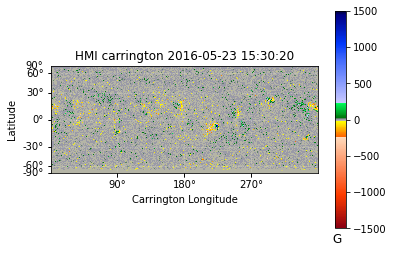

In [8]:
m_hmi.peek()


In [9]:
m_aia = sunpy.map.Map('/Users/ato/scripts/python_code/EBTEL/data/aia_lev1_193a_2016_05_20t11_51_41_84z_image_lev1.fits')

In [10]:
m_aia = aia_correction(m_aia)

m_aia = data_download_from_date(m_hmi.meta['date-obs'])

In [11]:
ar_center = SkyCoord(lon=222*u.deg, lat=-7*u.deg, frame=m_hmi.coordinate_frame)


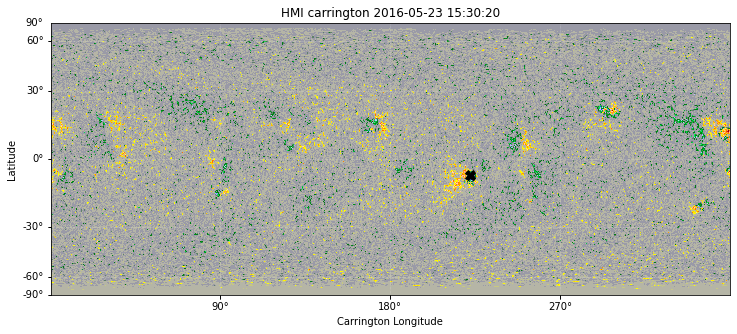

In [12]:
fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot(111, projection=m_hmi)
m_hmi.plot(axes=ax)
ax.plot_coord(ar_center, marker='X', ls='', color='k', markersize=10)


In [13]:
ar_center

<SkyCoord (HeliographicCarrington: obstime=2016-05-23T15:30:20.000, rsun=695700.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2016-05-23T15:30:20.000, rsun=695700.0 km): (lon, lat, radius) in (deg, deg, m)
    (0., -1.63376053, 1.51486001e+11)>): (lon, lat) in deg
    (222., -7.)>

In [14]:
ar_width = 200*u.arcsec
ar_height = 200*u.arcsec


In [15]:
ar_date = carrington_rotation_time(int(car_rot), ar_center.lon)
ar_center_corrected = change_obstime(ar_center, ar_date)


In [16]:
ar_center_corrected

<SkyCoord (HeliographicCarrington: obstime=2016-05-20 11:13:50.717, rsun=695700.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2016-05-20 11:13:50.717, rsun=695700.0 km): (lon, lat, radius) in (deg, deg, m)
    (0., -1.63376053, 1.51486001e+11)>): (lon, lat) in deg
    (222., -7.)>

In [17]:
m_trial = restore('20160520/m_aia_cutout.pickle')

Observatory,SDO
Instrument,AIA 2
Detector,AIA
Measurement,193.0 Angstrom
Wavelength,193.0 Angstrom
Observation Date,2016-05-20 11:51:41
Exposure Time,1.999634 s
Dimension,[1000. 1000.] pix
Coordinate System,helioprojective
Scale,[0.600714 0.600714] arcsec / pix
Reference Pixel,[572.0604115 665.57151476] pix

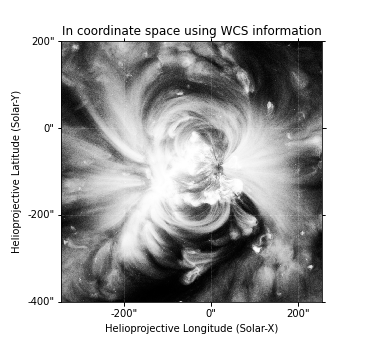
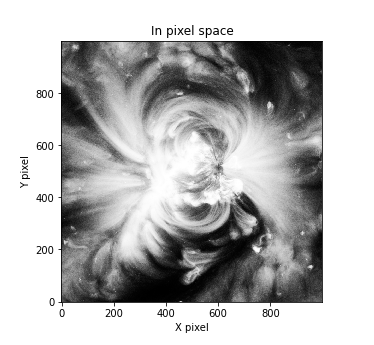
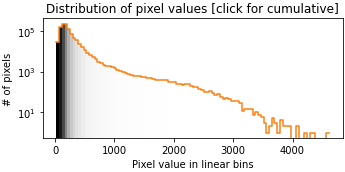
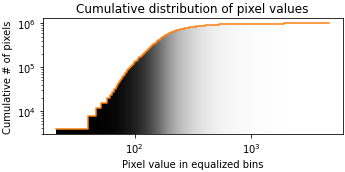

In [18]:
m_trial

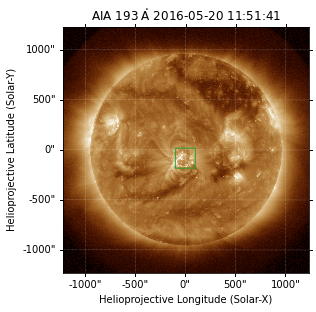

In [19]:
fig = plt.figure(figsize=(15,5))
m_cutouts = []
for i,m in enumerate([m_aia]):
    ax = fig.add_subplot(1,3,i+1,projection=m)
    m.plot(axes=ax,clip_interval=(1,99.99)*u.percent)
    #ax.plot_coord(ar_center_corrected, marker='o', ls='', color='C3')
    ar_center_corrected_transformed = ar_center_corrected.transform_to(m.coordinate_frame)
    blc = SkyCoord(Tx=ar_center_corrected_transformed.Tx-ar_width/2,
                   Ty=ar_center_corrected_transformed.Ty-ar_height/2,
                   frame=ar_center_corrected_transformed)
    m.draw_quadrangle(blc, width=ar_width, height=ar_height, edgecolor='C2', lw=1)


In [20]:
m_cutouts = []
for m in [m_aia]:
    ar_center_corrected_transformed = ar_center_corrected.transform_to(m.coordinate_frame)
    blc = SkyCoord(Tx=ar_center_corrected_transformed.Tx-ar_width/2,
                   Ty=ar_center_corrected_transformed.Ty-ar_height/2,
                   frame=ar_center_corrected_transformed)
    # Each map is rotated prior to submapping such that the selection is aligned with the coordinate grid
    m_rot = m.rotate(missing=0.0)
    m_cutout = m_rot.submap(blc, width=ar_width, height=ar_height)
    m_cutouts.append(m_cutout)


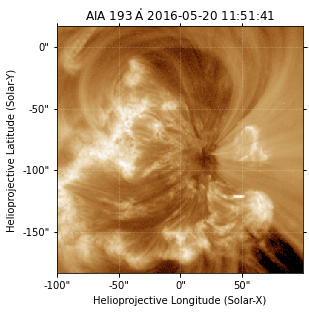

In [21]:
fig = plt.figure(figsize=(15,5))
for i,m in enumerate(m_cutouts):
    ax = fig.add_subplot(1,3,i+1,projection=m)
    m.plot(axes=ax,clip_interval=(1,99.99)*u.percent)


In [22]:
m_hmi_resample = m_hmi.resample((1080, 540)*u.pix)


In [23]:
nrho = 70
rss = 2.5
pfss_input = pfsspy.Input(m_hmi_resample, nrho, rss)


In [24]:
pfss_output = pfsspy.pfss(pfss_input)


In [25]:
m_cutouts = m_cutouts[0]
new_frame = change_obstime_frame(m_hmi.coordinate_frame, m_cutouts.date)
blc_ar_synop = change_obstime(m_cutouts.bottom_left_coord.transform_to(new_frame),
                              m_hmi.date)
trc_ar_synop = change_obstime(m_cutouts.top_right_coord.transform_to(new_frame),
                              m_hmi.date)


In [26]:
masked_pix_y, masked_pix_x = np.where(m_hmi_resample.data > 20)
seeds = m_hmi_resample.pixel_to_world(masked_pix_x*u.pix, masked_pix_y*u.pix,).make_3d()
in_lon = np.logical_and(seeds.lon > blc_ar_synop.lon, seeds.lon < trc_ar_synop.lon)
in_lat = np.logical_and(seeds.lat > blc_ar_synop.lat, seeds.lat < trc_ar_synop.lat)
seeds = seeds[np.where(np.logical_and(in_lon, in_lat))]


INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


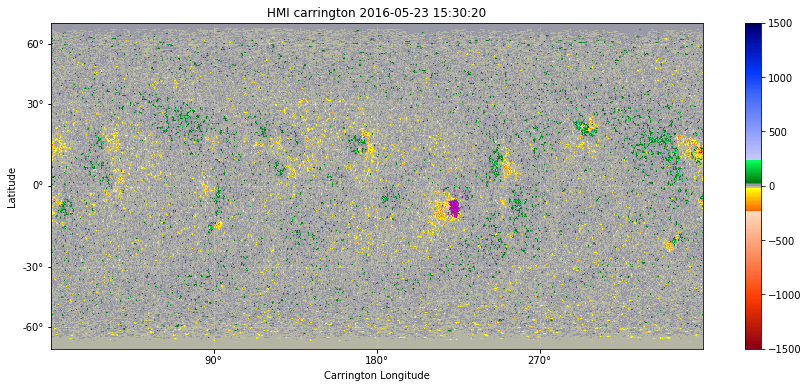

In [27]:
fig = plt.figure(figsize=(15,6))
ax = fig.add_subplot(111,projection=m_hmi_resample)
m_hmi_resample.plot(axes=ax,)
ax.plot_coord(seeds, marker='.', color='m', markersize=0.5, ls='')
m_hmi_resample.draw_quadrangle(m_aia.bottom_left_coord, top_right=m_aia.top_right_coord)
plt.colorbar()

In [28]:
ds = 0.01
max_steps = int(np.ceil(10 * nrho / ds))
tracer = pfsspy.tracing.FortranTracer(step_size=ds, max_steps=max_steps)
# tracer = pfsspy.tracing.FortranTracer(max_steps=max_steps)
fieldlines = tracer.trace(SkyCoord(seeds), pfss_output,)


INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


100%|█████████████████████████████████████████| 160/160 [00:02<00:00, 58.19it/s]


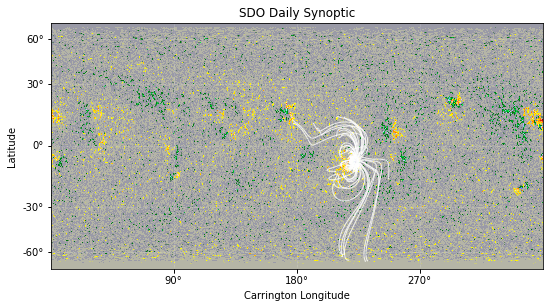

In [29]:
fig = plt.figure(figsize=(30,25))
for i,m in enumerate([m_hmi]):
    ax = fig.add_subplot(1,3,i+1,projection=m_hmi_resample)
    m_hmi_resample.plot(axes=ax,title='SDO Daily Synoptic')
    bounds = ax.axis()
    for c in tqdm(fieldlines[::2]):
        if len(c.coords) != 0:
            ax.plot_coord(c.coords, lw=1, color='white',alpha=.8)
    # ax.title('SDO Daily Synoptic replaced with HMI Carring synoptic header')
    ax.axis(bounds)


In [30]:
fline_coords_big = [change_obstime(f.coords, m_aia.date) for f in fieldlines.closed_field_lines if f.coords.shape[0]>9000]
fline_coords_small = [change_obstime(f.coords, m_aia.date) for f in fieldlines.closed_field_lines if f.coords.shape[0]<1800]
fline_coords_open = [change_obstime(f.coords, m_aia.date) for f in fieldlines.open_field_lines]





100%|█████████████████████████████████████████████| 7/7 [00:00<00:00, 33.94it/s]


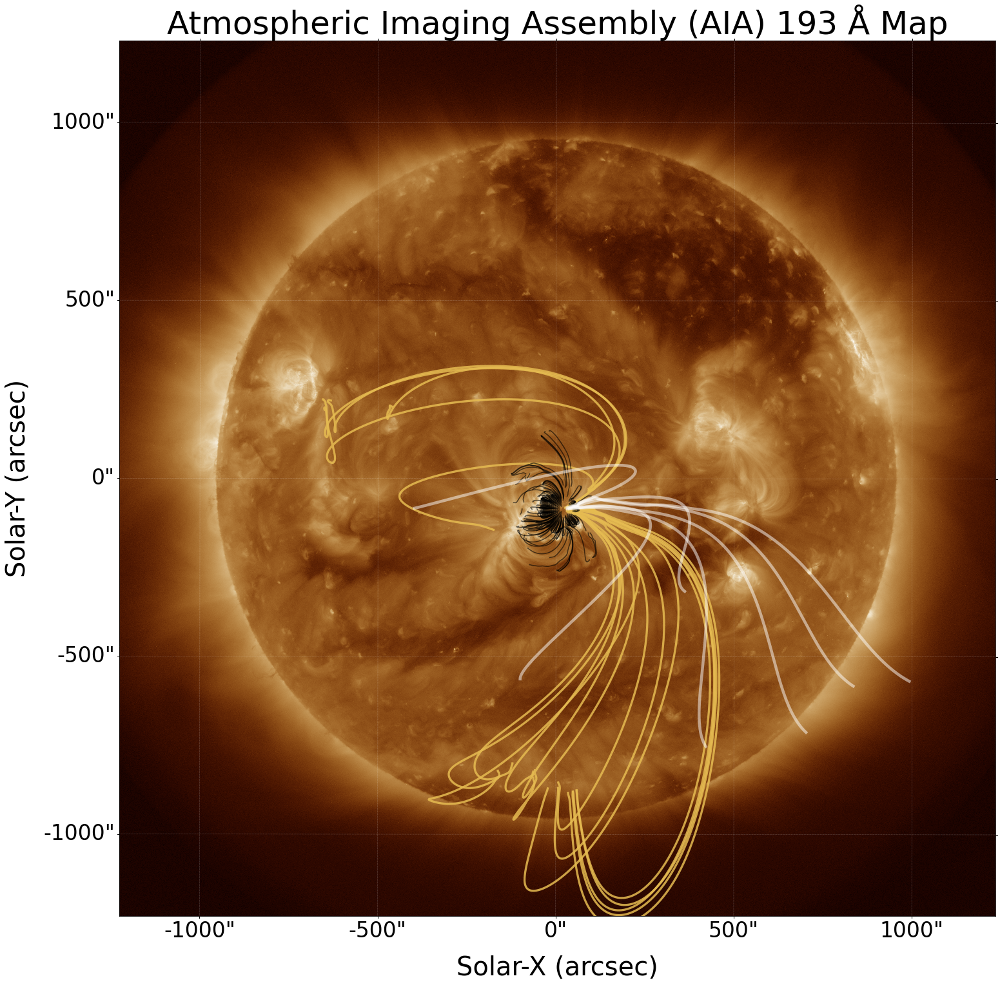

In [67]:
fig = plt.figure(figsize=(30,25))
for i,m in enumerate([m_hmi]):
    ax = fig.add_subplot(1,1,i+1,projection=m_aia)
    m_aia.plot(axes=ax)
    bounds = ax.axis()
    ax.set_title('Atmospheric Imaging Assembly (AIA) 193 \u212b Map', fontsize=50)
    ax.set_xlabel('Solar-X (arcsec)', fontsize=40)
    ax.set_ylabel('Solar-Y (arcsec)', fontsize=40)
    ax.tick_params(axis='both', labelsize=33)
    for c in tqdm(fline_coords_big):
        ax.plot_coord(c, lw=3.3, color='#E6BC52',alpha=.85)
    for c in tqdm(fline_coords_small):
        # ax.plot_coord(c, lw=1, color='firebrick',alpha=.75)
        # ax.plot_coord(c, lw=1, color='white',alpha=.6)
        ax.plot_coord(c, lw=1.5, color='black',alpha=.6)

    for c in tqdm(fline_coords_open):
        ax.plot_coord(c, lw=4.5, color='white',alpha=.5)
        # ax.plot_coord(c, lw=4.5, color='#921904',alpha=.9)

    #     if len(c.coords) != 0:
    #         ax.plot_coord(c.coords, lw=0.8, color='green',alpha=.8)
    # for c in tqdm(fieldlines.closed_field_lines[::5]):
    #     if len(c.coords) != 0:
    #         ax.plot_coord(c.coords, lw=.6, color='white',alpha=.7)
    # ax.title('SDO Daily Synoptic replaced with HMI Carring synoptic header')
    ax.axis(bounds)
fig.savefig('Debs_sunspot_paper/full_disk_black.png',dpi=150)
plt.show()

100%|██████████| 7/7 [00:00<00:00, 27.94it/s]


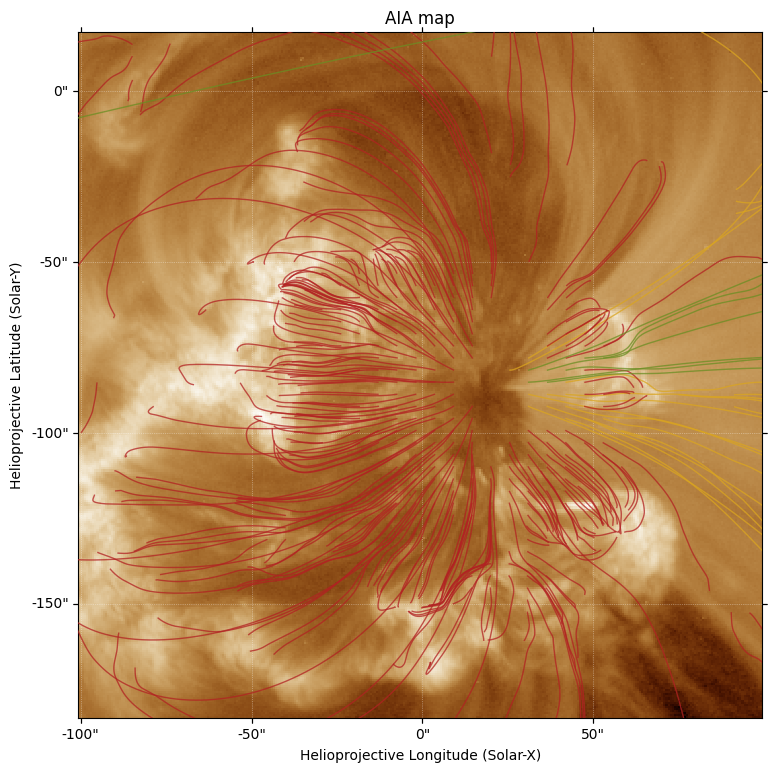

In [86]:
fig = plt.figure(figsize=(30,25))
for i,m in enumerate([m_hmi]):
    ax = fig.add_subplot(1,3,i+1,projection=m_cutout)
    m_cutout.plot(axes=ax,title='AIA map')
    bounds = ax.axis()
    for c in tqdm(fline_coords_big):
        ax.plot_coord(c, lw=1, color='goldenrod',alpha=.75)
    for c in tqdm(fline_coords_small):
        ax.plot_coord(c, lw=1, color='firebrick',alpha=.75)
    for c in tqdm(fline_coords_open):
        ax.plot_coord(c, lw=1, color='olivedrab',alpha=.75)

    #     if len(c.coords) != 0:
    #         ax.plot_coord(c.coords, lw=0.8, color='green',alpha=.8)
    # for c in tqdm(fieldlines.closed_field_lines[::5]):
    #     if len(c.coords) != 0:
    #         ax.plot_coord(c.coords, lw=.6, color='white',alpha=.7)
    # ax.title('SDO Daily Synoptic replaced with HMI Carring synoptic header')
    ax.axis(bounds)


In [91]:
pfss_output.get_bvec(fline_coords_big[0])

<Quantity [[            nan,             nan,             nan],
           [ 2.40561235e+01,  7.84890205e+01,  2.48571774e+02],
           [ 2.35986122e+01,  7.65089432e+01,  2.45842712e+02],
           ...,
           [-3.39617648e+01, -4.53749663e+00,  2.48560331e-01],
           [-3.42230021e+01, -4.44794734e+00,  2.44281041e-01],
           [-3.44842912e+01, -4.36047216e+00,  2.40120708e-01]]>

In [93]:
len(fline_coords_big[0])

9286

In [110]:
def get_loop_length(line):
    c = line.cartesian.xyz
    s = np.append(0., np.linalg.norm(np.diff(c.value, axis=1), axis=0).cumsum())
    return np.diff(s).sum()

def get_average_b(pfss_output, line):
    data = np.sqrt(np.nansum(np.square(pfss_output.get_bvec(line)),axis=1))
    data[data == 0] = np.nan
    return data, np.nanmean(data)



In [126]:
get_loop_length(fline_coords_open[6])/1e6

1257.8617808087836

In [127]:
fline_coords_small_length = []
fline_coords_small_field = []
for i in tqdm(fline_coords_small):
    length = get_loop_length(i)
    field, meanfield = get_average_b(pfss_output, i)
    fline_coords_small_length.append(length)
    fline_coords_small_field.append(meanfield)

fline_coords_big_length = []
fline_coords_big_field = []
for i in tqdm(fline_coords_small):
    length = get_loop_length(i)
    field, meanfield = get_average_b(pfss_output, i)
    fline_coords_big_length.append(length)
    fline_coords_big_field.append(meanfield)

fline_coords_open_length = []
fline_coords_open_field = []
for i in tqdm(fline_coords_small):
    length = get_loop_length(i)
    field, meanfield = get_average_b(pfss_output, i)
    fline_coords_open_length.append(length)
    fline_coords_open_field.append(meanfield)



In [113]:
get_loop_length(fline_coords_small[3])

71542678.7128347

In [34]:
print(np.sqrt(np.nansum(np.square(fieldlines[1].b_along_fline),axis=1)))

[ 0.         49.04462852 49.49482888 ... 26.47951585 26.68995685
 26.90076337]


In [30]:
data = np.sqrt(np.nansum(np.square(fieldlines[1].b_along_fline),axis=1))

In [47]:
pfss_output.get_bvec(fieldlines[1].coords)

<Quantity [[         nan,          nan,          nan],
           [ 37.12321343,  -4.13827894,  31.78234193],
           [ 36.73800804,  -4.33952074,  32.8819922 ],
           ...,
           [-26.41928086,   1.71084713,  -0.50927462],
           [-26.63281533,   1.68901094,  -0.44066574],
           [-26.84641327,   1.6673083 ,  -0.37582915]]>

In [48]:
fieldlines[1].b_along_fline

<Quantity [[         nan,          nan,          nan],
           [ 37.12321343,  -4.13827894,  31.78234193],
           [ 36.73800804,  -4.33952074,  32.8819922 ],
           ...,
           [-26.41928086,   1.71084713,  -0.50927462],
           [-26.63281533,   1.68901094,  -0.44066574],
           [-26.84641327,   1.6673083 ,  -0.37582915]]>

In [43]:
line = fieldlines[0]

In [44]:
c = line.coords.cartesian.xyz
s = np.append(0., np.linalg.norm(np.diff(c.value, axis=1), axis=0).cumsum())
print(np.diff(s).sum())


0.0


In [36]:
np.nanmean(data)

<Quantity 11.13194709>

In [35]:
np.nanmean(np.sqrt(np.nansum(np.square(fieldlines[1].b_along_fline),axis=1)))

<Quantity 11.12225871>

In [21]:
len(fieldlines.closed_field_lines)

2006

In [20]:
len(fieldlines.open_field_lines)

90

In [59]:
len(fieldlines[0])


0

In [57]:
line=fieldlines[0]
c = line.coords.cartesian.xyz
s = np.append(0., np.linalg.norm(np.diff(c.value, axis=1), axis=0).cumsum()) * c.unit


In [58]:
s

<Quantity [0.] m>

100%|███████████████████████████████████████████| 67/67 [00:00<00:00, 72.64it/s]


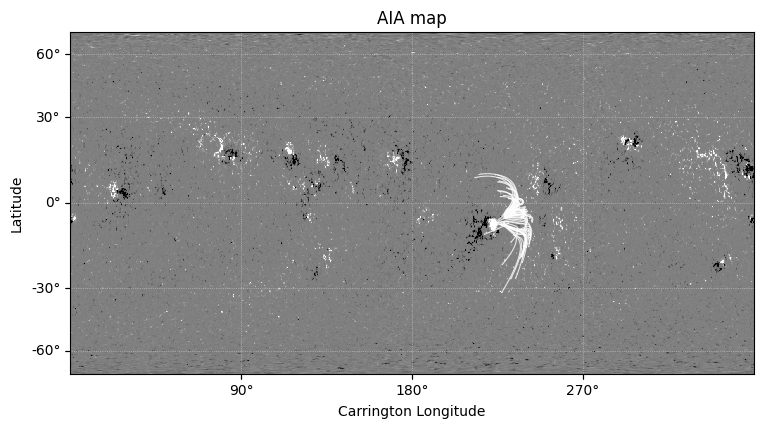

In [66]:
fig = plt.figure(figsize=(30,25))
for i,m in enumerate([m_hmi]):
    ax = fig.add_subplot(1,3,i+1,projection=m_hmi_resample)
    m_hmi_resample.plot(axes=ax,title='AIA map')
    bounds = ax.axis()
    for c in tqdm(fieldlines.open_field_lines):
        if len(c.coords) != 0:
            ax.plot_coord(c.coords, lw=0.8, color='white',alpha=.8)
    # ax.title('SDO Daily Synoptic replaced with HMI Carring synoptic header')
    ax.axis(bounds)


100%|█████████████████████████████████████████| 573/573 [00:28<00:00, 19.95it/s]


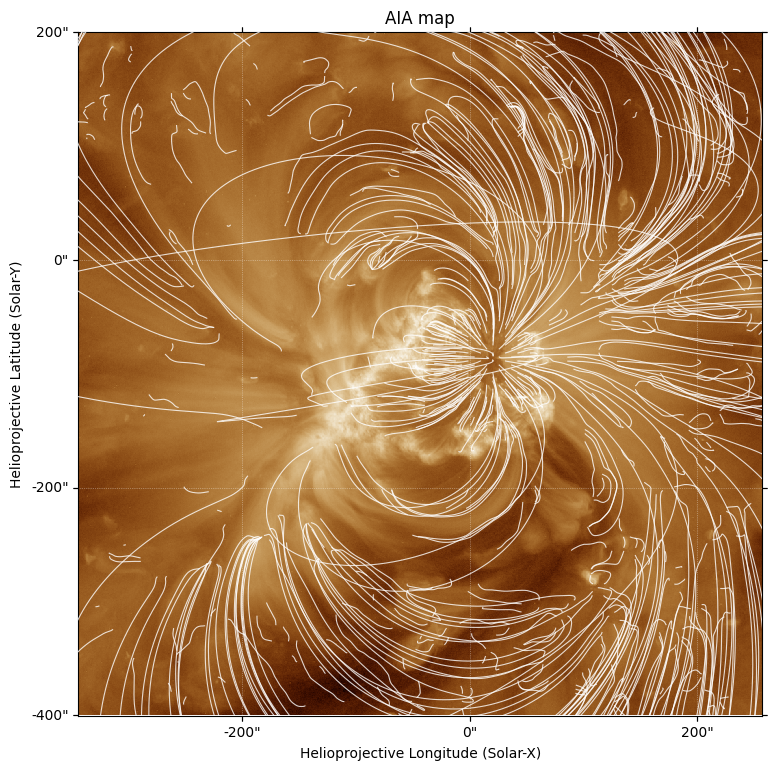

In [68]:
fig = plt.figure(figsize=(30,25))
for i,m in enumerate([m_hmi]):
    ax = fig.add_subplot(1,3,i+1,projection=m_cutout)
    m_cutout.plot(axes=ax,title='AIA map')
    bounds = ax.axis()
    for c in tqdm(fieldlines[::2]):
        if len(c.coords) != 0:
            ax.plot_coord(c.coords, lw=0.8, color='white',alpha=.8)
    # ax.title('SDO Daily Synoptic replaced with HMI Carring synoptic header')
    ax.axis(bounds)


100%|█████████████████████████████████████████| 229/229 [00:11<00:00, 20.29it/s]


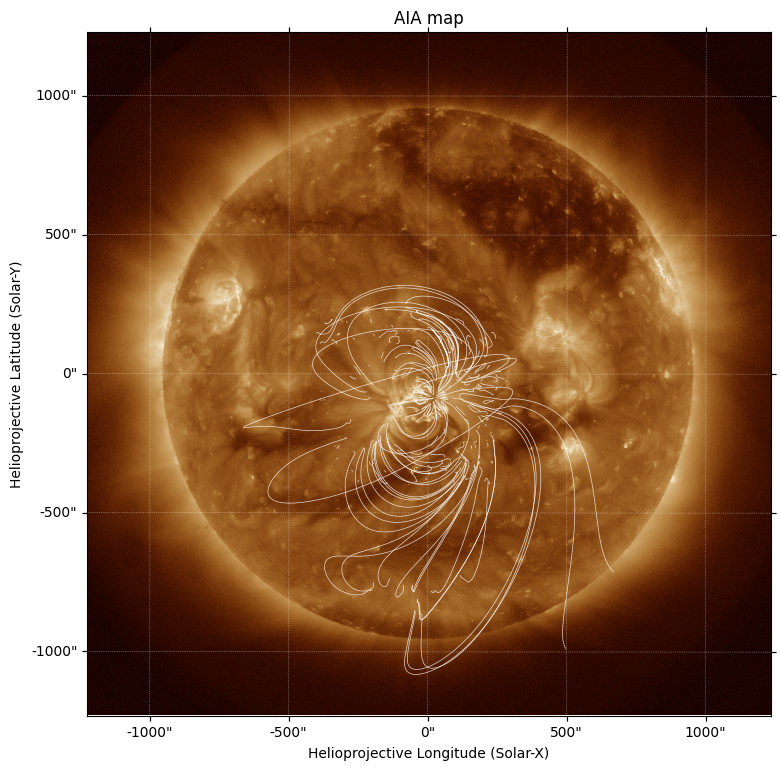

In [40]:
fig = plt.figure(figsize=(30,25))
for i,m in enumerate([m_hmi]):
    ax = fig.add_subplot(1,3,i+1,projection=m_aia)
    m_aia.plot(axes=ax,title='AIA map')
    bounds = ax.axis()
    for c in tqdm(fieldlines[::5]):
        if len(c.coords) != 0:
            ax.plot_coord(c.coords, lw=0.5, color='white',alpha=.8)
    # ax.title('SDO Daily Synoptic replaced with HMI Carring synoptic header')
    ax.axis(bounds)


In [36]:
print(fieldlines[1])

AttributeError: 'FieldLine' object has no attribute 'is_close'

In [9]:
ar_date = astropy.time.Time('2016-05-20T00:00:00')
jsoc_email = 'toshuho@gmail.com'

In [23]:
q = Fido.search(
    attrs.Time(car_rot_date, car_rot_date+1*u.day),
    # attrs.jsoc.Series('hmi.Mrdailysynframe_polfil_720s'),
    attrs.jsoc.Series('hmi.Mrdailysynframe_720s'),
    attrs.jsoc.Notify(jsoc_email),
)


In [24]:
f = Fido.fetch(q, path='./data/')

Export request pending. [id=JSOC_20230130_179_X_IN, status=2]
Waiting for 0 seconds...
1 URLs found for download. Full request totalling 20MB


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

hmi.mrdailysynframe_720s.20160520_120000_TAI.data.fits:   0%|          | 0.00/20.7M [00:00<?, ?B/s]

In [7]:
def PrepHMIdaily(hmidailyfilepath, numpix_x=3600, numpix_y= 1440):
    from astropy.io import fits
    import numpy as np
    import sunpy.map
    import astropy.time
    import matplotlib.pyplot as plt
    import astropy.units as u
    from sunpy.coordinates import sun


    #Can load only hmi.mrdailysynframe_polfil using astropy.io.fits
    hdus = fits.open(hmidailyfilepath)[0]
    # hdus.verify('fix')
    #Metadata fixing
    #Change sin(deg) to degree
    hdus.header["CUNIT1"] = 'deg'
    hdus.header["CUNIT2"] = 'deg'
    hdus.header["CDELT1"] = np.abs(hdus.header['cdelt1'])
    print(hdus.header["CDELT2"])
    hdus.header["CDELT2"] = 180 / np.pi * hdus.header["CDELT2"]
    # hdus.header["CRVAL1"] = sun.L0(time=hdus.header["DATE-OBS"],aberration_correction=True).value + 120
    # hmi_map.meta['CRVAL1'] = 120 + sun.L0(time=hmi_map.meta['T_OBS']).value

    hdus.header["CRLN_OBS"] = hdus.header["CRLN_OBS"] +120
    hdus.header["RSUN_REF"] = 6.957e8
    hdus.header["CADENCE"] = 360
    # original rsun =. 695500000.0
    del hdus.header["CRDER1"]
    del hdus.header["CRDER2"]
    del hdus.header["CSYSER1"]
    del hdus.header["CSYSER2"]

    hmi_syn_map = sunpy.map.Map(np.nan_to_num(hdus.data), hdus.header)
    time = hmi_syn_map.meta['T_OBS'][0:10].replace('.','-')+'T'+hmi_syn_map.meta['T_OBS'][11:-4]
    # time = '2011-04-13T20:42:28.087'
    t_hmi_syn = astropy.time.Time(time, scale='tai')
    print(t_hmi_syn)
    hdus.header["DATE-OBS"] = t_hmi_syn.utc.value
    # print(hdus.header["CRVAL1"])
    # print(sun.L0(time=t_hmi_syn.utc.value).value)
    # print(hdus.header["CRVAL1"])
    hdus.header["CRVAL1"] = sun.L0(time=t_hmi_syn.utc.value).value + 120
    hdus.header["CRVAL2"] = 0
    print(hdus.header["CRVAL1"])
    br = hdus.data - np.nanmean(hdus.data)
    br = np.roll(br, np.int32((hdus.header['CRVAL1'] + 180)/np.abs(hdus.header['cdelt1'])), axis=1)
    print(np.int32((hdus.header['CRVAL1'] + 180)/np.abs(hdus.header['cdelt1'])))
    hdus.header['CRVAL1'] = 759060.0
    hmi_syn_map = sunpy.map.Map(br, hdus.header)
    print(hdus.header["CRVAL1"])
    # hmi_syn_map.meta["CRVAL1"] = hdus.header['CRLN_OBS']
    hmi_syn_map.plot_settings['norm'] =plt.Normalize(-200,200)


#    #Resample to reduced computational time
    
    print(hmi_syn_map.dimensions)
    hmi_syn_map.meta['T_OBS'] = hmi_syn_map.meta['date-obs']
    print(f"CRVAL1: {hmi_syn_map.meta['CRVAL1']}")
    print(f"NEW CRVAL1: {hmi_syn_map.meta['CRVAL1']}")
    print(hmi_syn_map.meta['T_OBS'])
    # hmi_syn_map = hmi_syn_map.resample([numpix_x, numpix_y] * u.pix)## [longitude, latitude]
    
#     print(hmi_syn_map.date)   
#     print('New shape: ', hmi_syn_map.data.shape)

    return hmi_syn_map

In [8]:
m_hmi = PrepHMIdaily('/Users/ato/scripts/python_code/EBTEL/data/hmi.mrdailysynframe_720s.20160520_120000_TAI.data.fits')

0.001388888888888889
2016-05-20T11:54:06.016
341.6357046621506
5216
759060.0
PixelPair(x=<Quantity 3600. pix>, y=<Quantity 1440. pix>)
CRVAL1: 759060.0
NEW CRVAL1: 759060.0
2016-05-20T11:53:30.016


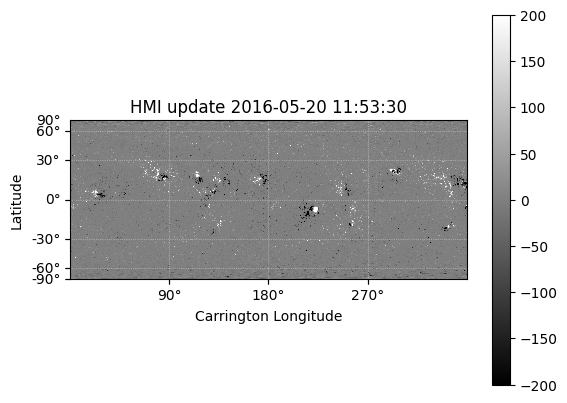

In [28]:
m_hmi.peek()

In [33]:
ar_center = SkyCoord(lon=220*u.deg, lat=-8*u.deg, frame=m_hmi.coordinate_frame)


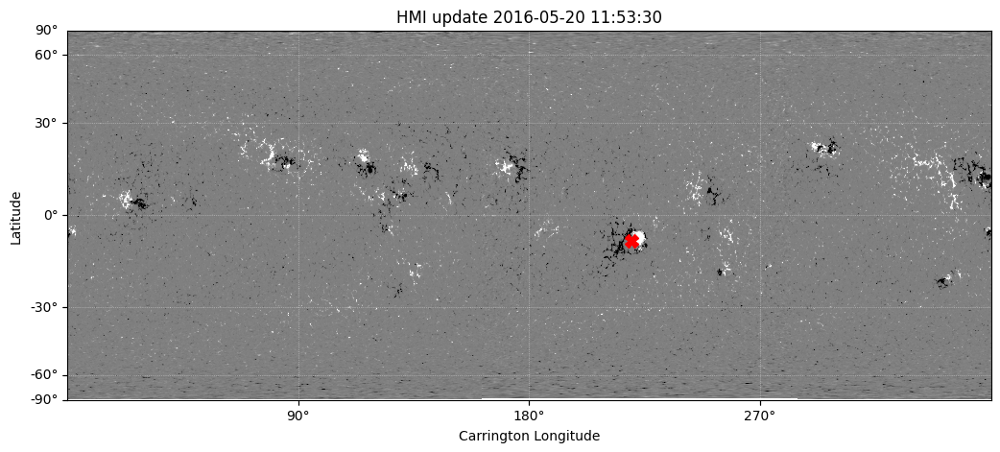

In [34]:
fig = plt.figure(figsize=(15,5))
ax = fig.add_subplot(111, projection=m_hmi)
m_hmi.plot(axes=ax)
ax.plot_coord(ar_center, marker='X', ls='', color='red', markersize=10)


In [3]:
aia_or_secchi = ((attrs.Instrument.aia)
                 & attrs.Wavelength(171*u.angstrom)
                 & attrs.Sample(5*u.minute))


In [14]:
m_hmi_time = astropy.time.Time(m_hmi.meta['date-obs'])

In [15]:
q = Fido.search(attrs.Time(m_hmi_time-2*u.minute, m_hmi_time+2*u.minute),
                aia_or_secchi)


In [1]:
save('data/HMI_daily_mr_synoptic_full_res.pickle', m_hmi)

'm_hmi)' was not found in history, as a file, url, nor in the user namespace.


In [16]:
files = Fido.fetch(q, path='./data/', overwrite=True)


Files Downloaded:   0%|          | 0/1 [00:00<?, ?file/s]

aia_lev1_171a_2016_05_20t11_51_34_35z_image_lev1.fits:   0%|          | 0.00/11.6M [00:00<?, ?B/s]

In [17]:
m_aia = sunpy.map.Map(sorted(files))


In [21]:
m_aia = correct_degradation(update_pointing(m_aia))
m_aia = m_aia / m_aia.exposure_time



In [6]:
m_hmi = m_hmi.resample((1080,540)*u.pix)

In [11]:
change_obstime = lambda x,y: SkyCoord(x.replicate(observer=x.observer.replicate(obstime=y), obstime=y))

change_obstime_frame = lambda x,y: x.replicate_without_data(observer=x.observer.replicate(obstime=y), obstime=y)


In [7]:
nrho = 70
rss = 2.5
pfss_input = pfsspy.Input(m_hmi, nrho, rss)

In [8]:
pfss_output = pfsspy.pfss(pfss_input)

synth_map.meta['CRVAL1'] = synth_map.meta['CRVAL1']-90

In [9]:
save('data/pfss_input_daily',pfss_input)
save('data/pfss_output_daily',pfss_output)


In [12]:
new_frame = change_obstime_frame(m_hmi.coordinate_frame, m_hmi.date)
blc_ar_synop = change_obstime(aia_submap.bottom_left_coord.transform_to(new_frame),
                              m_hmi.date)
trc_ar_synop = change_obstime(aia_submap.top_right_coord.transform_to(new_frame),
                              m_hmi.date)


In [13]:
masked_pix_y, masked_pix_x = np.where(m_hmi.data > 5e1)
seeds = m_hmi.pixel_to_world(masked_pix_x*u.pix, masked_pix_y*u.pix,).make_3d()
in_lon = np.logical_and(seeds.lon > blc_ar_synop.lon, seeds.lon < trc_ar_synop.lon)
in_lat = np.logical_and(seeds.lat > blc_ar_synop.lat, seeds.lat < trc_ar_synop.lat)
seeds = seeds[np.where(np.logical_and(in_lon, in_lat))]


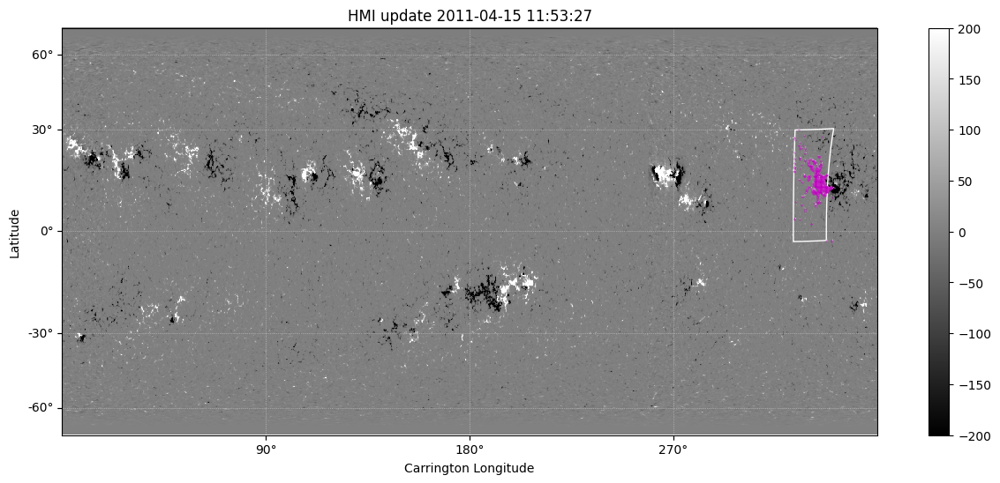

In [17]:
fig = plt.figure(figsize=(15,6))
ax = fig.add_subplot(111,projection=m_hmi)
m_hmi.plot(axes=ax,)
ax.plot_coord(seeds, marker='.', color='m', markersize=0.5, ls='')
m_hmi.draw_quadrangle(aia_submap.bottom_left_coord, top_right=aia_submap.top_right_coord)
plt.colorbar()

In [15]:
ds = 0.01
max_steps = int(np.ceil(10 * nrho / ds))*1

tracer = pfsspy.tracing.FortranTracer(max_steps=max_steps)
fieldlines = tracer.trace(SkyCoord(seeds), pfss_output,)


In [19]:
mean = []
for i in tqdm(fieldlines):
    if len(i.coords) != 0:
        mean.append(np.median(np.sqrt(np.sum(np.square(np.nan_to_num(i.b_along_fline)),axis=1))))

100%|██████████████████████████████████████████| 669/669 [00:10<00:00, 64.47it/s]


In [21]:
np.mean(mean)

91.16099435407003

100%|███████████████████████████████████████████| 223/223 [00:02<00:00, 86.65it/s]


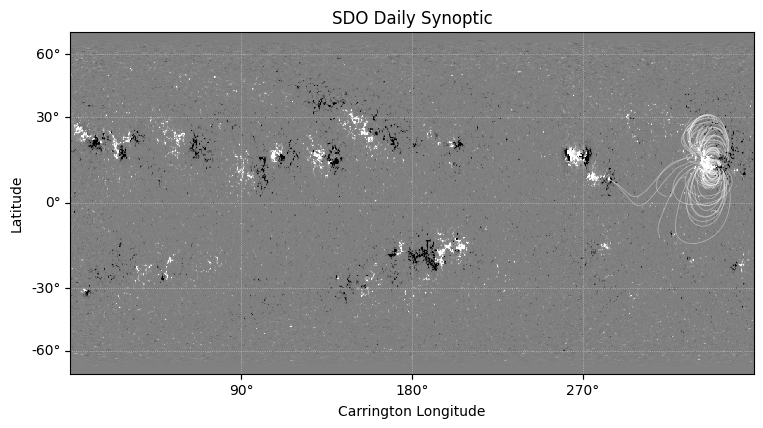

In [27]:
fig = plt.figure(figsize=(30,25))
for i,m in enumerate([m_hmi]):
    ax = fig.add_subplot(1,3,i+1,projection=m_hmi)
    m_hmi.plot(axes=ax,title='SDO Daily Synoptic')
    bounds = ax.axis()
    for c in tqdm(fieldlines[::3]):
        if len(c.coords) != 0:
            ax.plot_coord(c.coords, lw=0.5, color='white',alpha=.45)
    # ax.title('SDO Daily Synoptic replaced with HMI Carring synoptic header')
    ax.axis(bounds)


In [39]:
np.mean(mean)

90.3007329387531

In [30]:
fline_coords = [change_obstime(f.coords, ar_date) for f in fieldlines.closed_field_lines]

In [109]:
len(fieldlines[70].coords)

29

100%|███████████████████████████████████████████████| 166/166 [00:01<00:00, 101.00it/s]


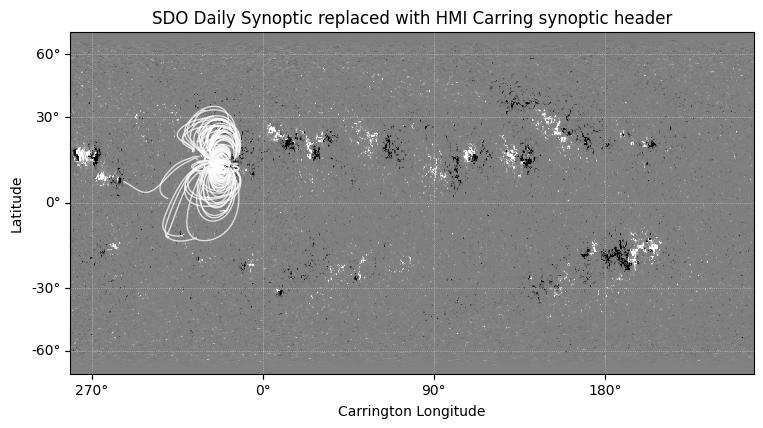

In [31]:
fig = plt.figure(figsize=(30,25))
for i,m in enumerate([m_hmi]):
    ax = fig.add_subplot(1,3,i+1,projection=m_hmi)
    m_hmi.plot(axes=ax,title='SDO Daily Synoptic replaced with HMI Carring synoptic header')
    bounds = ax.axis()
    for c in tqdm(fieldlines[::4]):
        if len(c.coords) != 0:
            ax.plot_coord(c.coords, lw=1, color='white',alpha=.75)
    # ax.title('SDO Daily Synoptic replaced with HMI Carring synoptic header')
    ax.axis(bounds)


In [34]:
m_hmi.meta

MetaDict([('simple', True),
          ('bitpix', -64),
          ('naxis', 2),
          ('naxis1', 1350),
          ('naxis2', 540),
          ('n_extrap', 0),
          ('s_extrap', 0),
          ('method', 'TEMP_SPAT'),
          ('lat0', 60.0),
          ('latfil', 75.0),
          ('latfil1', 62.0),
          ('nmax', 5),
          ('date', '2018-01-19T23:03:36.000'),
          ('telescop', 'SDO/HMI'),
          ('instrume', 'HMI_SIDE1'),
          ('wavelnth', 6173.0),
          ('bunit', 'Mx/cm^2'),
          ('origin', 'SDO/JSOC-SDP'),
          ('content', 'Update Synoptic MAP (Mr)'),
          ('history', o2helio.c bug corrected -- July 2013),
          ('comment',
             FITS (Flexible Image Transport System) format is defined in 'Astronomy
             and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H
             This FITS file may contain long string keyword values that are
             continued over multiple keywords.  The HEASARC convention us

In [24]:
line = fieldlines[711].coords
line

<SkyCoord (HeliographicCarrington: obstime=2011-04-15T11:53:27.595, rsun=696000.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2011-04-15T11:53:27.595, rsun=696000.0 km): (lon, lat, radius) in (deg, deg, m)
    (120.03598697, -5.59298658, 1.50075245e+11)>): (lon, lat, radius) in (deg, deg, m)
    [(330.11873926, 20.90145771, 6.95720557e+08),
     (330.12073664, 20.90788202, 6.95769495e+08),
     (330.12268497, 20.91437729, 6.95817517e+08),
     (330.12458229, 20.92094335, 6.95864602e+08),
     (330.12642673, 20.92757981, 6.95910724e+08),
     (330.12821653, 20.93428603, 6.95955863e+08),
     (330.12995   , 20.94106115, 6.96000000e+08),
     (330.13162559, 20.9479041 , 6.96043117e+08),
     (330.13324188, 20.95481358, 6.96085199e+08),
     (330.13479756, 20.96178813, 6.96126232e+08),
     (330.13629148, 20.96882607, 6.96166207e+08),
     (330.13772264, 20.97592559, 6.96205115e+08),
     (330.13909017, 20.98308473, 6.96242949e+08),
     (330.14039335, 20.99030142, 6.96279707e

In [28]:
average = [np.mean(np.sqrt(np.sum(np.square(pfss_output.get_bvec(i.coords)),axis=1))) for i in tqdm(fieldlines)]

100%|█████████████████████████████████████████| 572/572 [00:17<00:00, 31.99it/s]


In [29]:
np.median(average)

2.2848759166846317

In [76]:
np.where(average == np.max(average))


(array([711]),)

In [57]:
line.transform_to(pfss_output.coordinate_frame)

<SkyCoord (HeliographicCarrington: obstime=2011-04-15T11:53:27.595, rsun=696000.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2011-04-15T11:53:27.595, rsun=696000.0 km): (lon, lat, radius) in (deg, deg, m)
    (120.03598697, -5.59298658, 1.50075245e+11)>): (lon, lat, radius) in (deg, deg, m)
    [(336.79661667, 12.94843637, 6.96000000e+08),
     (337.40450139, 13.33780011, 6.97826162e+08)]>

In [26]:
line = fieldlines[0].coords

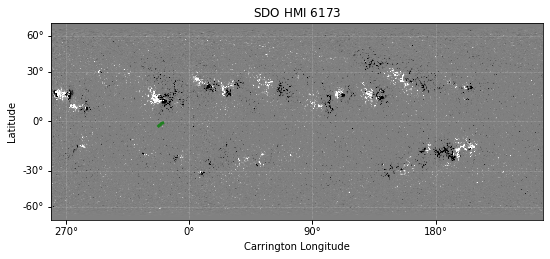

In [27]:
fig = plt.figure(figsize=(30,25))
for i,m in enumerate([m_hmi]):
    ax = fig.add_subplot(1,3,i+1,projection=m_hmi)
    m_hmi.plot(axes=ax,title=f'{m.observatory} {m.detector} {m.wavelength.to_string(format="latex")}')
    bounds = ax.axis()
    ax.plot_coord(line, lw=3, color='green',alpha=.75)
    ax.axis(bounds)


In [32]:
m_hmi.meta['s_extrap']=1

In [34]:
m_hmi.meta

MetaDict([('simple', True),
          ('bitpix', -64),
          ('naxis', 2),
          ('naxis1', 1080),
          ('naxis2', 540),
          ('n_extrap', 0),
          ('s_extrap', 1),
          ('method', 'TEMP_SPAT'),
          ('lat0', 60.0),
          ('latfil', 75.0),
          ('latfil1', 62.0),
          ('nmax', 5),
          ('date', '2018-01-19T23:03:36.000'),
          ('telescop', 'SDO/HMI'),
          ('instrume', 'HMI_SIDE1'),
          ('wavelnth', 6173.0),
          ('bunit', 'Mx/cm^2'),
          ('origin', 'SDO/JSOC-SDP'),
          ('content', 'Update Synoptic MAP (Mr)'),
          ('history', o2helio.c bug corrected -- July 2013),
          ('comment',
             FITS (Flexible Image Transport System) format is defined in 'Astronomy
             and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H
             This FITS file may contain long string keyword values that are
             continued over multiple keywords.  The HEASARC convention us

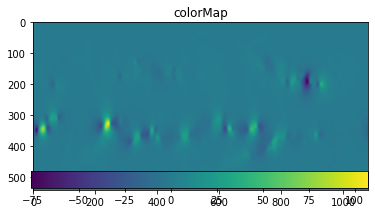

In [41]:
import numpy as np
import matplotlib.pyplot as plt

H = pfss_output.bg[...,0][...,3].T

fig = plt.figure(figsize=(6, 3.2))

ax = fig.add_subplot(111)
ax.set_title('colorMap')
plt.imshow(H)
ax.set_aspect('equal')

cax = fig.add_axes([0.12, 0.1, 0.78, 0.8])
cax.get_xaxis().set_visible(False)
cax.get_yaxis().set_visible(False)
cax.patch.set_alpha(0)
cax.set_frame_on(False)
plt.colorbar(orientation='horizontal')
plt.show()


## HMI synoptic map test

In [5]:
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

import astropy.units as u
import astropy.coordinates as coord
from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import frame_transform_graph

import sunpy.map
import sunpy.coordinates as spc

In [7]:
filename = '/Users/ato/Downloads/ds9.fits'

In [8]:
hdus = fits.open(filename)
hdus.verify('fix')

In [9]:
# extract the data
data = hdus[0].data

In [10]:
header = dict(hdus[0].header)

In [12]:
header['CUNIT2'] = 'deg'
del header['HGLN_OBS']

In [13]:
m = sunpy.map.Map((data, header))
# Set the colorbar properties.
m.plot_settings['cmap'] = 'hmimag'
m.plot_settings['norm'] = plt.Normalize(-1500, 1500)

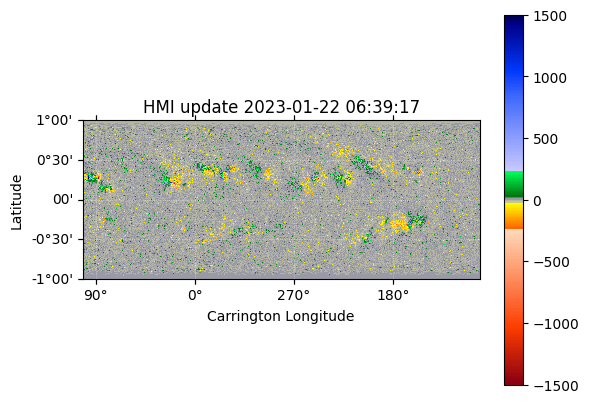

In [22]:
m.peek()

In [15]:
print(m.coordinate_system)

SpatialPair(axis1='CRLN-CEA', axis2='CRLT-CEA')


In [16]:
print(m.coordinate_frame)

<HeliographicCarrington Frame (obstime=2023-01-22T06:39:17.547, rsun=696000.0 km, observer=<HeliographicStonyhurst Coordinate (obstime=2023-01-22T06:39:17.547, rsun=696000.0 km): (lon, lat, radius) in (deg, deg, m)
    (-126.30583648, -5.59298658, 1.50075245e+11)>)>


In [17]:
class ASineHGC(spc.HeliographicCarrington):
    """
    This frame is a reverse transformation from the HGC frame with CUNIT2 sin(deg) to the real HGC frame.
    It is defined backwards because the WCS object for the HGC sin(deg) frame reads in as a proper HGC frame
    due to the values of CTYPE. This frame therefore converts from what WCS thinks is HGC to ASineHGC but is
    in reality converting from ASineHGC to HGC.
    """
    
@frame_transform_graph.transform(coord.FunctionTransform, spc.HeliographicCarrington, ASineHGC)
def hgc_to_sinehgc(hgc_coord, sinehgc_frame):
    lat = hgc_coord.lat
    lon = hgc_coord.lon
    
    lat_out = u.Quantity(np.arcsin(lat.value), u.rad)
    
    return sinehgc_frame.realize_frame(coord.UnitSphericalRepresentation(lat=lat_out, lon=lon))

@frame_transform_graph.transform(coord.FunctionTransform, ASineHGC, spc.HeliographicCarrington)
def sinehgc_to_hgc(sinehgc_coord, hgc_frame):
    lat = sinehgc_coord.lat
    lon = sinehgc_coord.lon
    
    lat_out = u.Quantity(np.sin(lat.value), u.deg)
    
    return hgc_frame.realize_frame(coord.UnitSphericalRepresentation(lat=lat_out, lon=lon))

Text(0.5, 1.0, 'HMI Daily Synoptic Frame for Carrington Rotation 2109-2110')

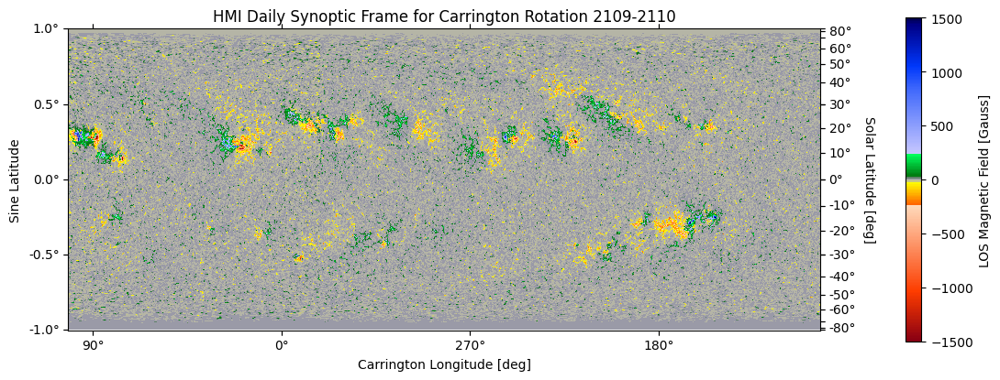

In [20]:
# Create a figure with the Map's projection:
fig = plt.figure(figsize=(12,5))
axes = plt.subplot(projection=m)

# Plot the image
im = m.plot()

# Set up the Sine Latitude Grid
x = axes.coords[0]
y = axes.coords[1]

x.set_coord_type('longitude', coord_wrap=360.)

x.set_major_formatter('dd')
y.set_major_formatter('d.d')

x.set_axislabel("Carrington Longitude [deg]")
y.set_axislabel("Sine Latitude")


x.set_ticks(color='black', exclude_overlapping=True)
y.set_ticks(color='black', exclude_overlapping=True)

# Hide the grid
axes.coords.grid(alpha=0)

# Create a colorbar
cb = plt.colorbar(im,fraction=0.019, pad=0.1)
cb.set_label("LOS Magnetic Field [Gauss]")

# Now create the overlay in the actual HGC coordinate frame

overlay = axes.get_coords_overlay('asinehgc')

lon = overlay[0]
lat = overlay[1]

lon.set_ticks_visible(False)
lon.set_ticklabel_visible(False)

lat.set_major_formatter('dd')

lat.set_axislabel('Solar Latitude [deg]')

lat.set_ticks_position('tr')
lat.set_ticks(spacing=10*u.deg, exclude_overlapping=True)

# Another horrible hack to make the ticks draw on the RHS
axes.set_xlim((0, 3585))

plt.title("HMI Daily Synoptic Frame for Carrington Rotation {}-{}".format(header['CAR_ROT'], header['CAR_ROT']+1))

In [21]:
overlay

<CoordinatesMap with 2 world coordinates:

  index aliases    type   unit wrap format_unit visible
  ----- ------- --------- ---- ---- ----------- -------
      0     lon longitude  deg  360         deg     yes
      1     lat  latitude  deg None         deg     yes

>

In [23]:
m_hmi_carrington=restore('20110415/m_hmi_carrington_synoptic.pickle')

INFO: Missing metadata for solar radius: assuming the standard radius of the photosphere. [sunpy.map.mapbase]


Observatory,SDO
Instrument,HMI SIDE1
Detector,HMI
Measurement,carrington
Wavelength,6173.0 Angstrom
Observation Date,2022-03-21 03:52:10
Exposure Time,Unknown
Dimension,[1080. 540.] pix
Coordinate System,heliographic_carrington
Scale,[0.33333333 0.21220659] deg / pix
Reference Pixel,[539.35 269.5 ] pix

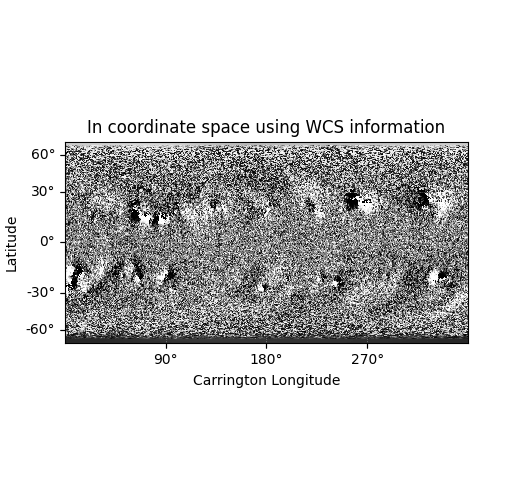
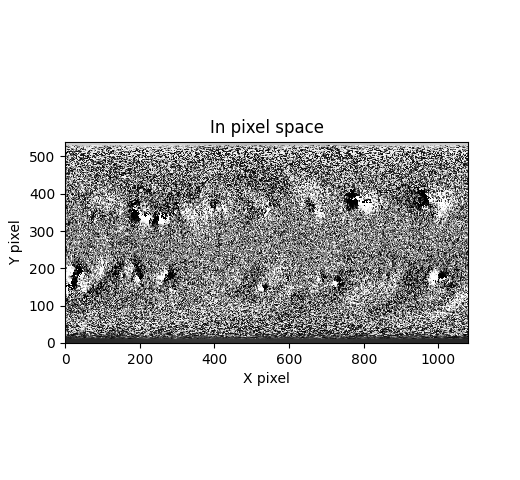
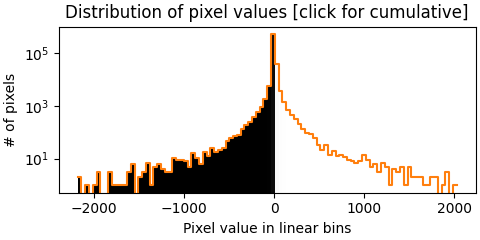
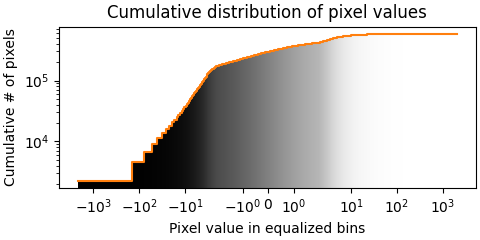

In [24]:
m_hmi_carrington

Observatory,SDO
Instrument,HMI SIDE1
Detector,HMI
Measurement,update
Wavelength,6173.0
Observation Date,2011-04-15 11:53:27
Exposure Time,Unknown
Dimension,[1080. 540.] pix
Coordinate System,heliographic_carrington
Scale,[0.33333333 0.21220659] deg / pix
Reference Pixel,[539.35 269.5 ] pix

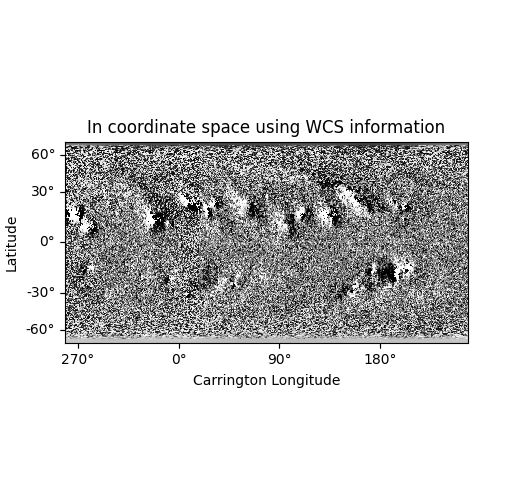
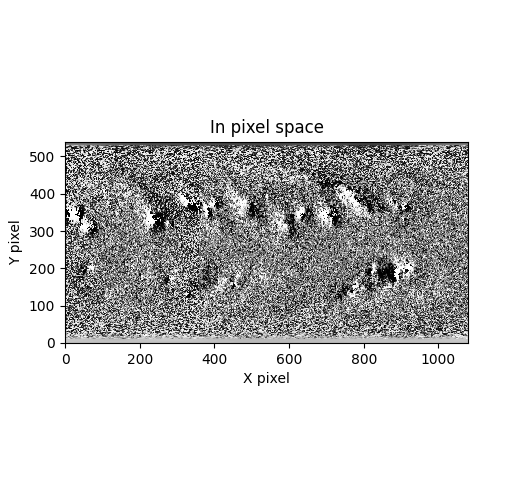
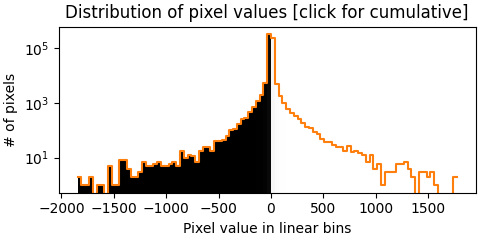
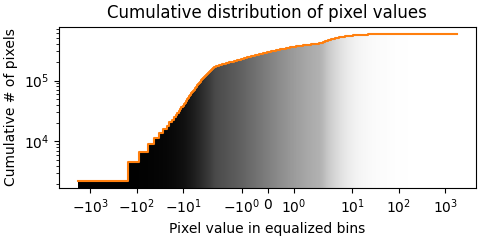

In [25]:
m_hmi

In [27]:
synth_map = sunpy.map.Map(m_hmi.data, m_hmi_carrington.meta)

In [41]:
synth_map.meta

MetaDict([('simple', True),
          ('bitpix', 32),
          ('naxis', 2),
          ('naxis1', 1080),
          ('naxis2', 540),
          ('blank', -2147483648),
          ('bzero', 0.0),
          ('bscale', 0.1),
          ('checksum', 'RGSAR9Q3REQ9R9Q9'),
          ('datasum', '151797971'),
          ('n_extrap', 0),
          ('s_extrap', 1),
          ('method', 'TEMP_SPAT'),
          ('lat0', 60.0),
          ('latfil', 75.0),
          ('latfil1', 62.0),
          ('nmax', 5),
          ('date', '2022-10-21T17:42:29.000'),
          ('telescop', 'SDO/HMI'),
          ('instrume', 'HMI_SIDE1'),
          ('wavelnth', 6173.0),
          ('bunit', 'Mx/cm^2'),
          ('content', 'Carrington Synoptic Chart Of Br Field'),
          ('history',
           'Carrington-Time conversion corrected; o2helio.c bug corrected -- July 2013'),
          ('comment',
           "FITS (Flexible Image Transport System) format is defined in 'Astronomy  and Astrophysics', volume 376, page 359;

In [39]:
synth_map.meta["CRLN_OBS"] = synth_map.meta["CRLN_OBS"] +120


KeyError: 'crln_obs'

Observatory,SDO
Instrument,HMI SIDE1
Detector,HMI
Measurement,carrington
Wavelength,6173.0 Angstrom
Observation Date,2022-03-21 03:52:10
Exposure Time,Unknown
Dimension,[1080. 540.] pix
Coordinate System,heliographic_carrington
Scale,[0.33333333 0.21220659] deg / pix
Reference Pixel,[539.35 269.5 ] pix

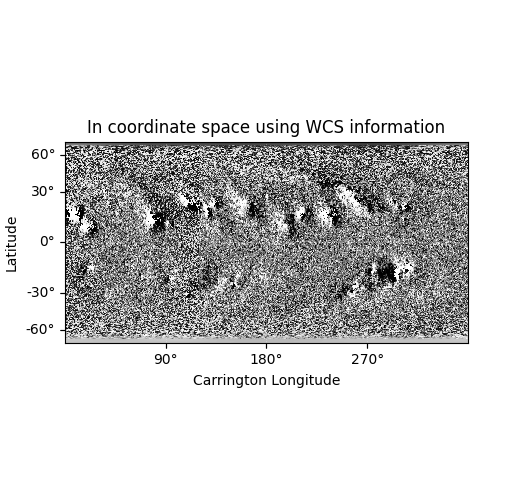
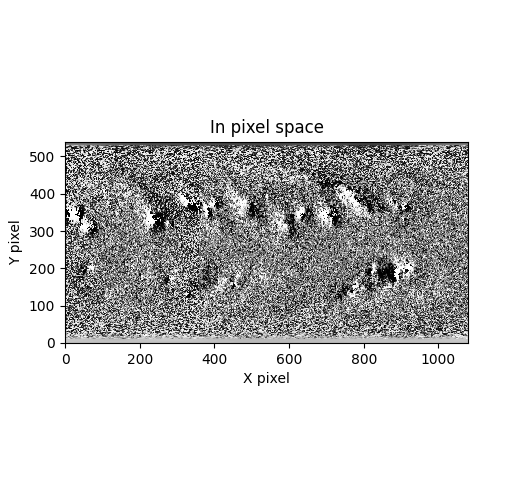
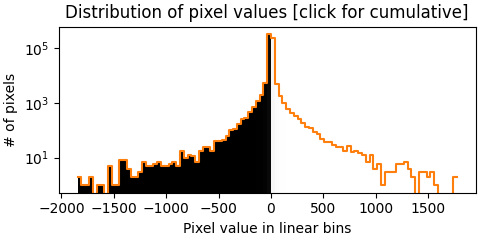
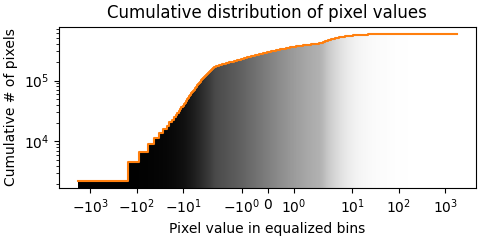

In [40]:
synth_map

In [2]:
from functions_pickle import *

In [3]:
data = restore('/Users/ato/Downloads/synth_map.pickle')

Observatory,SDO
Instrument,AIA 2
Detector,AIA
Measurement,193.0 Angstrom
Wavelength,193.0 Angstrom
Observation Date,2016-05-20 11:51:41
Exposure Time,1.999634 s
Dimension,[1000. 1000.] pix
Coordinate System,helioprojective
Scale,[0.600714 0.600714] arcsec / pix
Reference Pixel,[572.0604115 665.57151476] pix

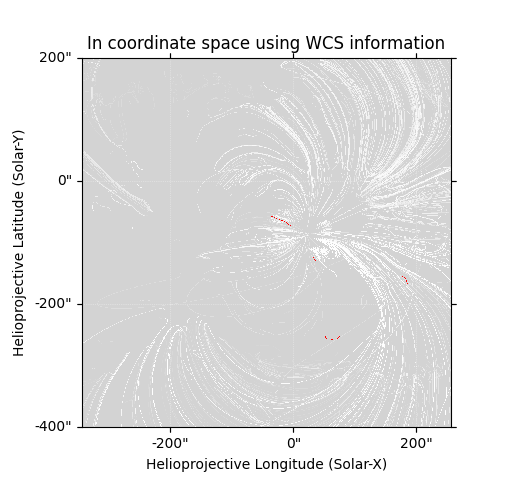
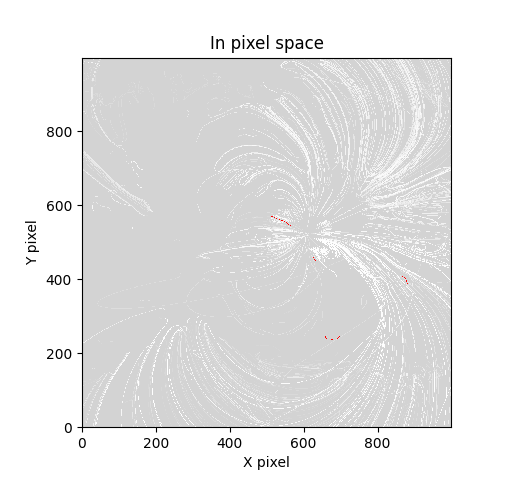
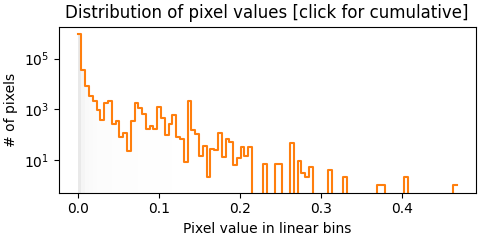
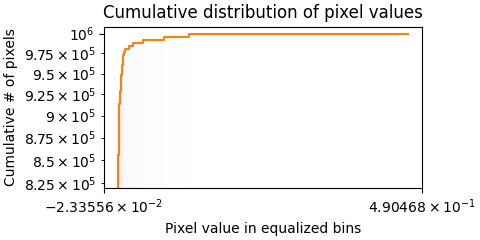

In [4]:
data

In [10]:
import numpy as np

In [15]:
np.nanmax(data.data)

0.46711238473653793

In [21]:
import sunpy

In [8]:
sunpy.map.Map(syn, data.meta)

NameError: name 'sunpy' is not defined

In [1]:
from matplotlib import pyplot as plt

AttributeError: 'ImageNormalize' object has no attribute 'callbacks'

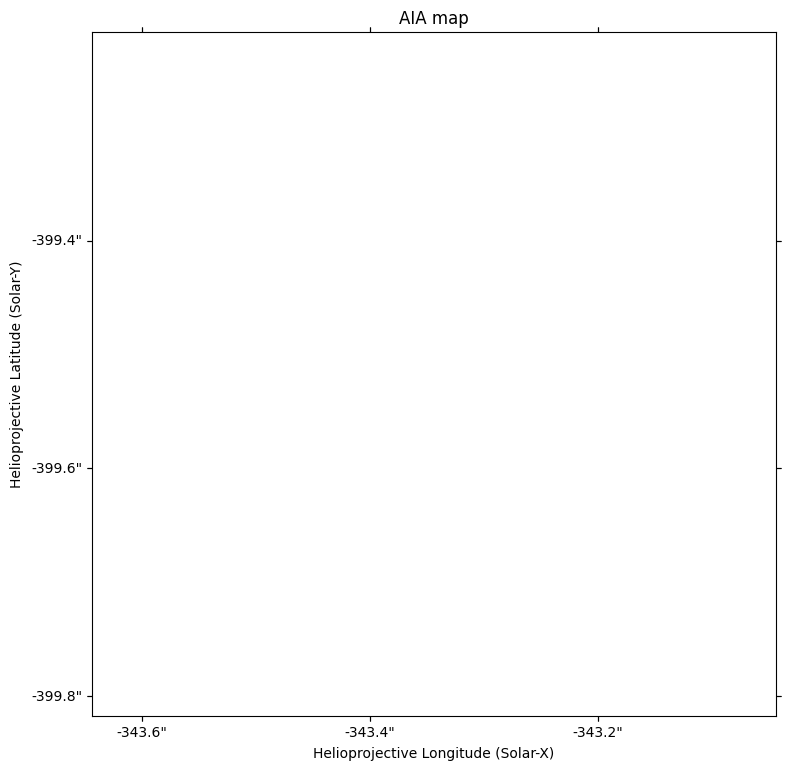

In [7]:
fig = plt.figure(figsize=(30,25))
for i,m in enumerate([data]):
    ax = fig.add_subplot(1,3,i+1,projection=data)
    data.plot(axes=ax,title='AIA map')
    bounds = ax.axis()
    # for c in tqdm(fieldlines[::2]):
    #     if len(c.coords) != 0:
    #         ax.plot_coord(c.coords, lw=0.8, color='white',alpha=.8)
    # ax.title('SDO Daily Synoptic replaced with HMI Carring synoptic header')
    ax.axis(bounds)
